# Debugging notebook for preprocess_mvtec_to_boxes.py

This notebook will sample random pictures from our dataset and will show them and plot their bounding boxes.  

We will use the **Capsule** data from the [MVTec AD dataset](https://www.mvtec.com/company/research/datasets/mvtec-ad).  
The data is released under the *Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License (CC BY-NC-SA 4.0)*.  
The dataset is used strictly for non-commercial, educational purposes.

Because the dataset provides pixel wise mask pictures for the defects, and our main project will use bounding boxes, we created a script that defines bounding boxes from this masks and exports the annotations as a csv file.  


This notebook:  
- Randomly samples images from the dataset  
- Loads the corresponding bounding boxes  
- Overlays the boxes on the images for visual inspection  

The goal is to verify that the preprocessing script correctly extracted and labeled bounding boxes from the original defect masks.  

In [1]:
# Imports
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import random

In [2]:
# Load annotations CSV
df = pd.read_csv('../data/capsule/annotations.csv')

# Check the first few rows of the DataFrame
df.head()

,image_path,set,class_name,x_min,y_min,x_max,y_max
0,../data/capsule/train/good/095.png,train,good,NaN,NaN,NaN,NaN
1,../data/capsule/train/good/036.png,train,good,NaN,NaN,NaN,NaN
2,../data/capsule/train/good/028.png,train,good,NaN,NaN,NaN,NaN
3,../data/capsule/train/good/039.png,train,good,NaN,NaN,NaN,NaN
4,../data/capsule/train/good/149.png,train,good,NaN,NaN,NaN,NaN


In [6]:
# Function to get an image and overlay its bounding box
def plot_image_with_box(image_path, xmin, ymin, xmax, ymax, label):
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    xmin, ymin, xmax, ymax = int(xmin), int(ymin), int(xmax), int(ymax)
    label = str(label)

    if label != 'good':  # only draw if box exists
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color=(0, 255, 0), thickness=2)
        cv2.putText(img, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [4]:
rnd_good = df[df['class_name'] == 'good'].sample(5)
rnd_defect = df[df['class_name'] != 'good'].sample(10)

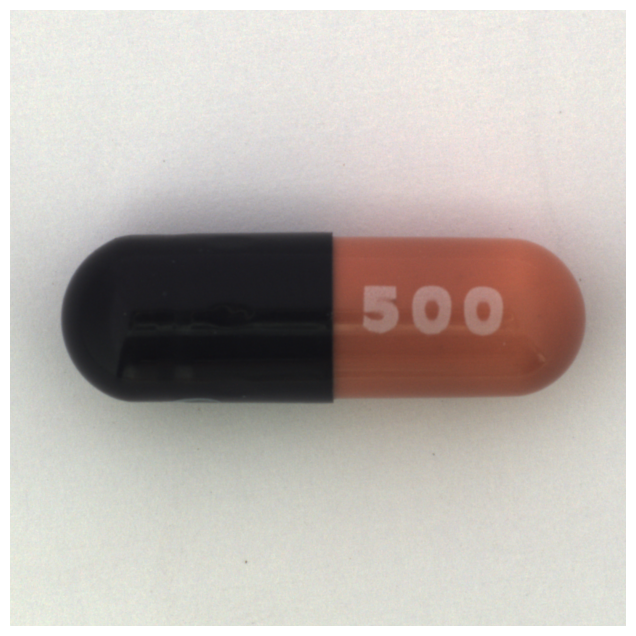

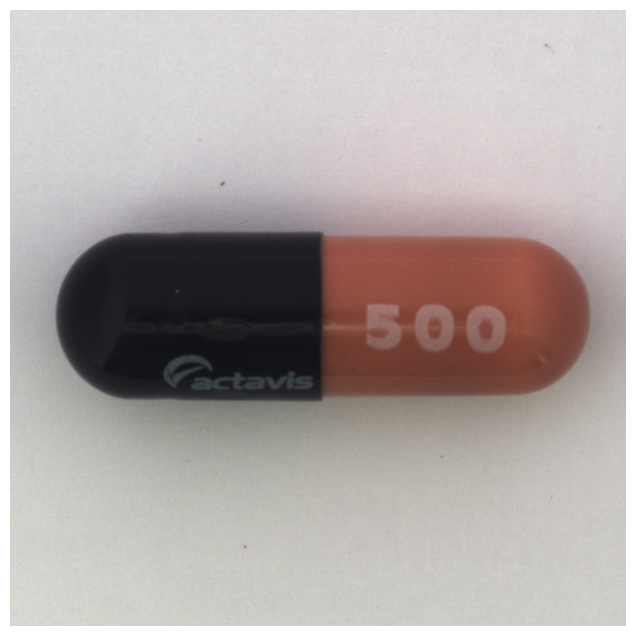

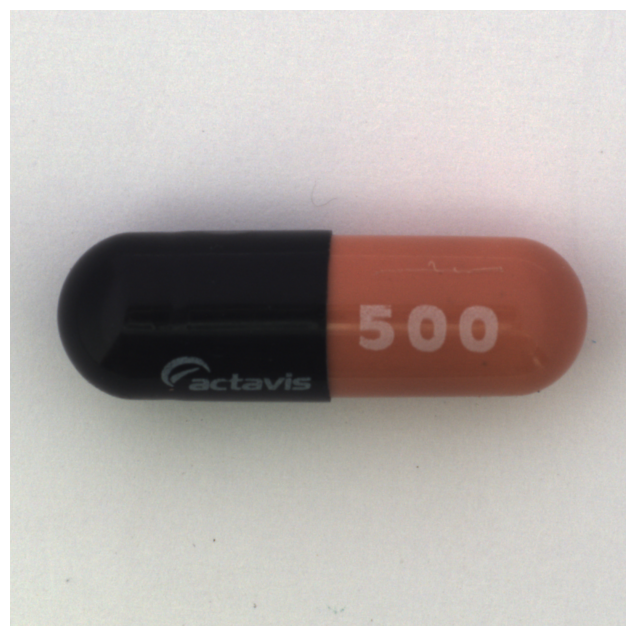

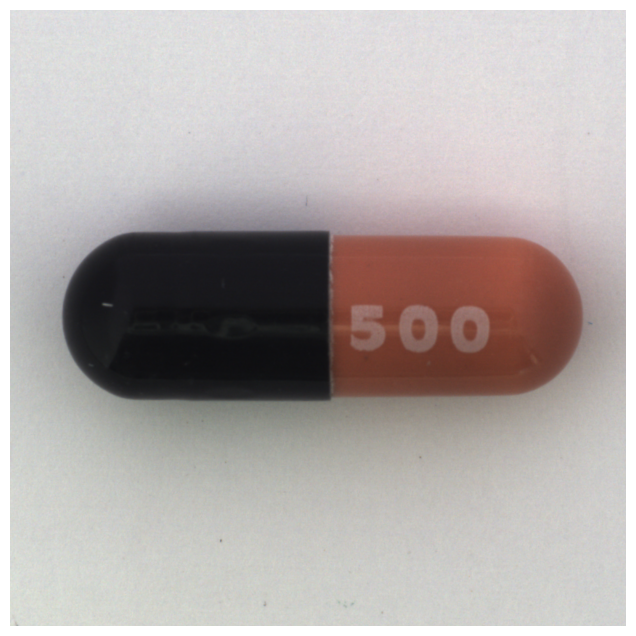

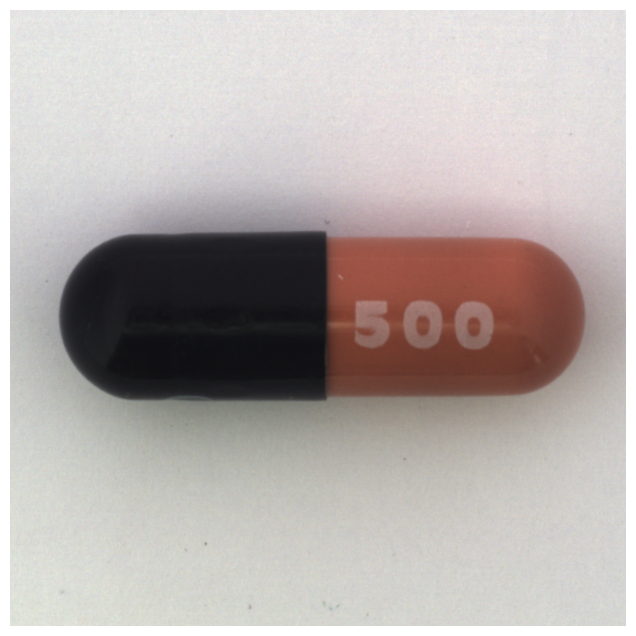

...

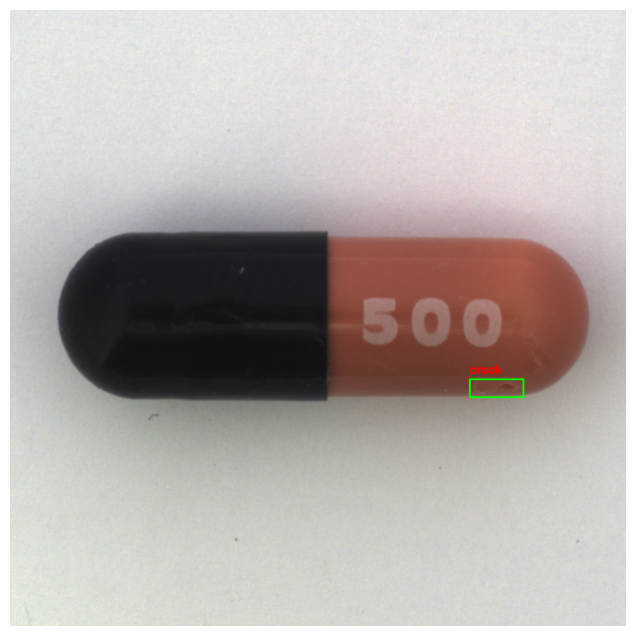

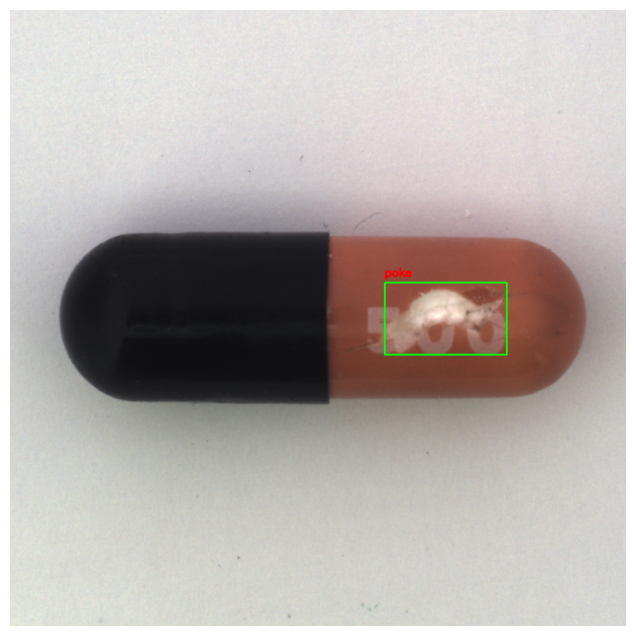

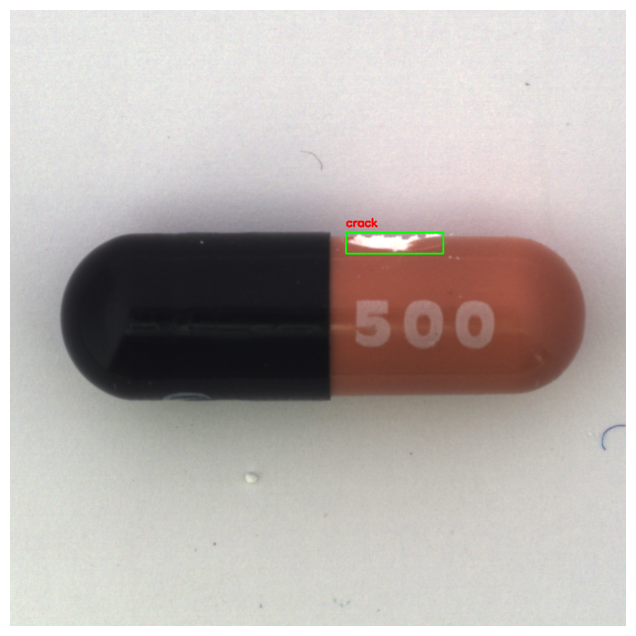

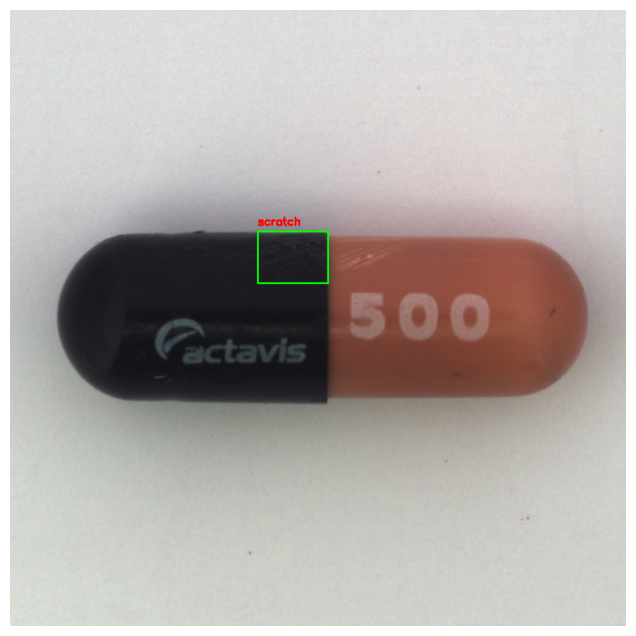

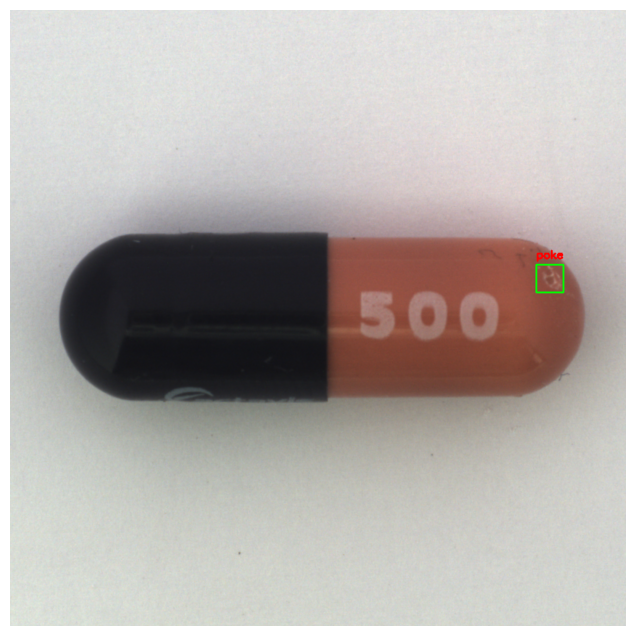

In [8]:
# Iterate through the sample paths and plot images with bounding boxes
for idx, row in rnd_good.iterrows():
    plot_image_with_box(row['image_path'],
                        0, 0, 0, 0,
                        'good')

for idx, row in rnd_defect.iterrows():
    plot_image_with_box(row['image_path'],
                        row['x_min'], row['y_min'], row['x_max'], row['y_max'],
                        row['class_name'])